In [1]:
import warnings
warnings.filterwarnings('ignore')

import glob
import numpy as np # linear algebra
import pandas as pd 

from PIL import Image
import matplotlib.pyplot as plt
import os

from tensorflow.keras import preprocessing
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D,Dropout,Dense,Flatten,Conv2DTranspose,BatchNormalization,LeakyReLU,Reshape

import tensorflow as tf
from tensorflow.keras.utils import plot_model

 # Load Images

In [2]:
all_images_path = []
full_image_train_path = "../input/celeba-dataset/img_align_celeba/img_align_celeba"

for path in os.listdir(full_image_train_path):
    all_images_path.append(os.path.join(full_image_train_path, path))
    
image_path_50K = all_images_path[:50000]

In [3]:
print(len(image_path_50K))

50000


In [4]:
# Model Constant
PLOTS_DPI = 150

# Scaling images

In [5]:
from tqdm.notebook import tqdm
cropping_box = (30, 55, 150, 175)

train_image = [np.array(Image.open(path).crop(cropping_box).resize((64, 64))) for path in tqdm(image_path_50K)]

for i in tqdm(range(len(train_image))):
    train_image[i] = (train_image[i] - train_image[i].min()) / (255 - train_image[i].min())

train_image = np.array(train_image)

print(train_image.shape)

  0%|          | 0/50000 [00:00<?, ?it/s]

  0%|          | 0/50000 [00:00<?, ?it/s]

(50000, 64, 64, 3)


# Visulaization

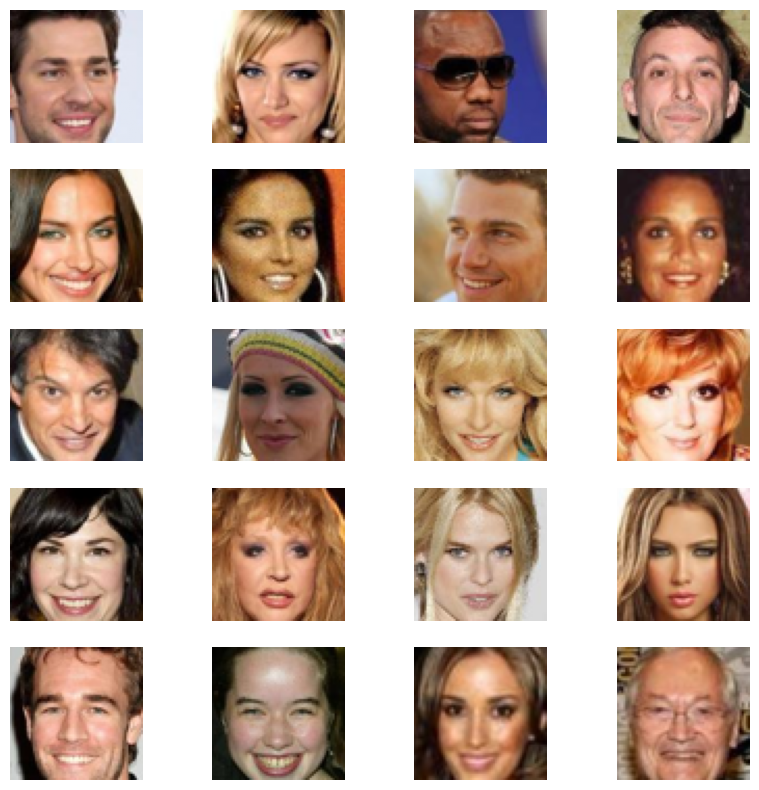

In [15]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for i in range(20):
    plt.subplot(5, 4, i+1)
    plt.imshow(train_image[i])  # Index the specific image
    plt.axis('off')
plt.show()


# Creating Generator

In [111]:
noise_shape = 100

generator = Sequential()
    
generator.add(Dense(4*4*512, input_shape=[noise_shape]))
    
    # add reshape layers
generator.add(Reshape([4,4,512]))
generator.add(Conv2DTranspose(256, kernel_size=4, strides = 2, padding='same'))

generator.add(LeakyReLU(alpha=0.2))
    
generator.add(Conv2DTranspose(128, kernel_size=4, strides = 2, padding='same'))
generator.add(LeakyReLU(alpha=0.2))

    
generator.add(Conv2DTranspose(64, kernel_size=4, strides = 2, padding='same'))
generator.add(LeakyReLU(alpha=0.2))
     
generator.add(Conv2DTranspose(3, kernel_size =4, strides=2, padding='same', activation='sigmoid'))
    

generator = generator_model()
generator.summary()

Model: "sequential_21"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_16 (Dense)            (None, 8192)              827392    
                                                                 
 reshape_9 (Reshape)         (None, 4, 4, 512)         0         
                                                                 
 conv2d_transpose_33 (Conv2  (None, 8, 8, 256)         2097408   
 DTranspose)                                                     
                                                                 
 batch_normalization_24 (Ba  (None, 8, 8, 256)         1024      
 tchNormalization)                                               
                                                                 
 leaky_re_lu_40 (LeakyReLU)  (None, 8, 8, 256)         0         
                                                                 
 conv2d_transpose_34 (Conv2  (None, 16, 16, 128)     

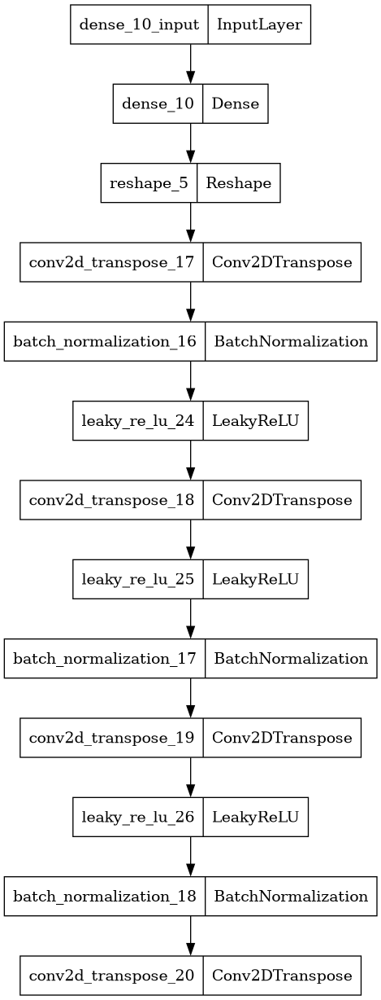

In [109]:
plot_model(generator)

# Generating Noise Using Generator Model

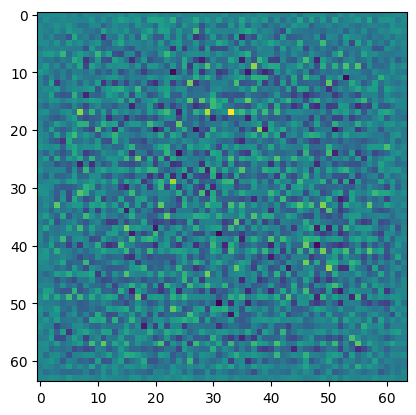

In [106]:
noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)
plt.imshow(generated_image[0,:,:,0])

# Descriminator

In [114]:

discriminator = Sequential()
discriminator.add(Conv2D(64, (3,3), strides=2, padding='same', input_shape=[64, 64, 3]))
discriminator.add(LeakyReLU(alpha=0.2))
discriminator.add(Conv2D(64,(3,3), strides = 2, padding = 'same'))
discriminator.add(BatchNormalization())
discriminator.add(LeakyReLU())
discriminator.add(Flatten())
discriminator.add(Dense(1, activation='sigmoid'))
discriminator = Discriminator_model()
discriminator.summary()

Model: "sequential_27"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_26 (Conv2D)          (None, 32, 32, 64)        1792      
                                                                 
 leaky_re_lu_53 (LeakyReLU)  (None, 32, 32, 64)        0         
                                                                 
 conv2d_27 (Conv2D)          (None, 16, 16, 64)        36928     
                                                                 
 batch_normalization_31 (Ba  (None, 16, 16, 64)        256       
 tchNormalization)                                               
                                                                 
 leaky_re_lu_54 (LeakyReLU)  (None, 16, 16, 64)        0         
                                                                 
 flatten_13 (Flatten)        (None, 16384)             0         
                                                     

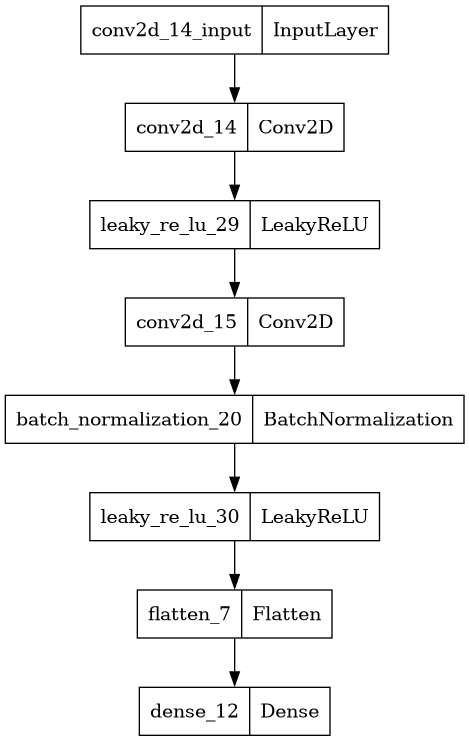

In [108]:
plot_model(discriminator)

# DCGAN

In [115]:
class DCGAN(keras.Model):
    
    def __init__(self, generator, discriminator, latent_dim):
        super().__init__()
        self.generator = generator
        self.discriminator = discriminator
        self.latent_dim = latent_dim
        self.g_loss_metric = keras.metrics.Mean(name='g_loss')
        self.d_loss_metric = keras.metrics.Mean(name='d_loss')
        
    @property
    def metrics(self):
        return [self.g_loss_metric, self.d_loss_metric]
    
    def compile(self, g_optimizer, d_optimizer, loss_fn):
        super(DCGAN, self).compile()
        self.g_optimizer = g_optimizer
        self.d_optimizer = d_optimizer
        self.loss_fn = loss_fn
        
    def train_step(self, real_images):
        # get batch size from the data
        batch_size = tf.shape(real_images)[0]
        # generate random noise
        random_noise = tf.random.normal(shape=(batch_size, self.latent_dim))
        
        # train the discriminator with real (1) and fake (0) images
        with tf.GradientTape() as tape:
            # compute loss on real images
            pred_real = self.discriminator(real_images, training=True)
            # generate real image labels
            real_labels = tf.ones((batch_size, 1))
            # label smoothing
            real_labels += 0.05 * tf.random.uniform(tf.shape(real_labels))
            d_loss_real = self.loss_fn(real_labels, pred_real)
            
            # compute loss on fake images
            fake_images = self.generator(random_noise)
            pred_fake = self.discriminator(fake_images, training=True)
            # generate fake labels
            fake_labels = tf.zeros((batch_size, 1))
            d_loss_fake = self.loss_fn(fake_labels, pred_fake)
            
            # total discriminator loss
            d_loss = (d_loss_real + d_loss_fake) / 2
            
        # compute discriminator gradients
        gradients = tape.gradient(d_loss, self.discriminator.trainable_variables)
        # update the gradients
        self.d_optimizer.apply_gradients(zip(gradients, self.discriminator.trainable_variables))
        
        
        # train the generator model
        labels = tf.ones((batch_size, 1))
        # generator want discriminator to think that fake images are real
        with tf.GradientTape() as tape:
            # generate fake images from generator
            fake_images = self.generator(random_noise, training=True)
            # classify images as real or fake
            pred_fake = self.discriminator(fake_images, training=True)
            # compute loss
            g_loss = self.loss_fn(labels, pred_fake)
            
        # compute gradients
        gradients = tape.gradient(g_loss, self.generator.trainable_variables)
        # update the gradients
        self.g_optimizer.apply_gradients(zip(gradients, self.generator.trainable_variables))
        
        # update states for both models
        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)
        
        return {'d_loss': self.d_loss_metric.result(), 'g_loss': self.g_loss_metric.result()}

# DC GAN Monitor 

In [116]:
class DCGANMonitor(keras.callbacks.Callback):
    def __init__(self, num_imgs=10, latent_dim=100):
        self.num_imgs = num_imgs
        self.latent_dim = latent_dim
        # create random noise for generating images
        self.noise = tf.random.normal([25, latent_dim])

    def on_epoch_end(self, epoch, logs=None):
        # generate the image from noise
        g_img = self.model.generator(self.noise)
        # denormalize the image
        g_img = (g_img * 127.5) + 127.5
        g_img.numpy()
        
        fig = plt.figure(figsize=(8, 8))
        for i in range(self.num_imgs):
            plt.subplot(2, 5, i+1)
            img = array_to_img(g_img[i])
            plt.imshow(img)
            plt.axis('off')
        # plt.savefig('epoch_{:03d}.png'.format(epoch))
        plt.show()
        
    def on_train_end(self, logs=None):
        self.model.generator.save('generator.h5')

In [117]:
dcgan = DCGAN(generator = generator, discriminator = discriminator, latent_dim = noise_shape)

In [118]:
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.optimizers import Adam

D_LR = 0.0001 
G_LR = 0.0003
dcgan.compile(g_optimizer=Adam(learning_rate=G_LR, beta_1=0.5), d_optimizer=Adam(learning_rate=D_LR, beta_1=0.5), loss_fn=BinaryCrossentropy())


Epoch 1/60
1562/1563 [============================>.] - ETA: 0s - d_loss: 1.1631 - g_loss: 0.1272

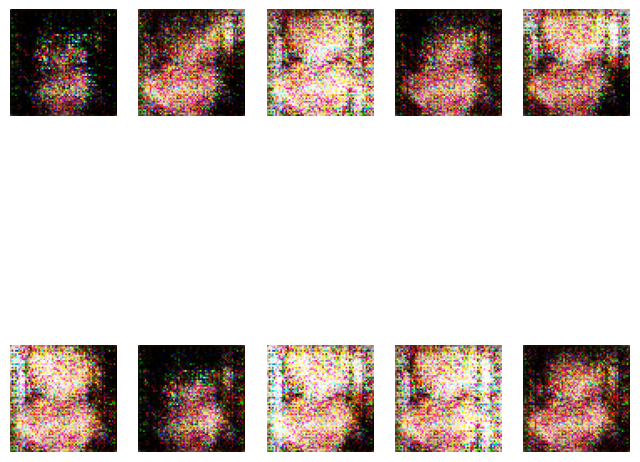

1563/1563 [==============================] - 39s 22ms/step - d_loss: 1.1633 - g_loss: 0.1273
Epoch 2/60
1563/1563 [==============================] - ETA: 0s - d_loss: 0.9265 - g_loss: 0.6479

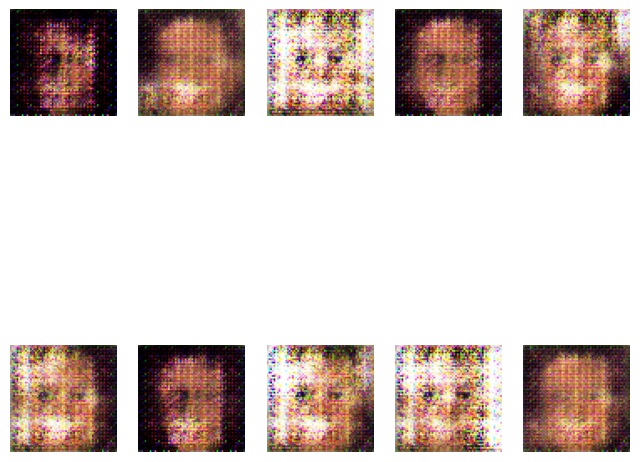

1563/1563 [==============================] - 35s 22ms/step - d_loss: 0.9265 - g_loss: 0.6479
Epoch 3/60
1561/1563 [============================>.] - ETA: 0s - d_loss: 0.7796 - g_loss: 0.7272

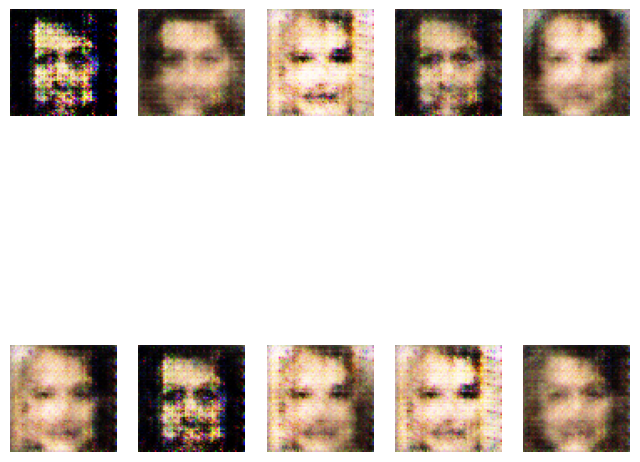

1563/1563 [==============================] - 34s 22ms/step - d_loss: 0.7795 - g_loss: 0.7272
Epoch 4/60
1561/1563 [============================>.] - ETA: 0s - d_loss: 0.7541 - g_loss: 0.7415

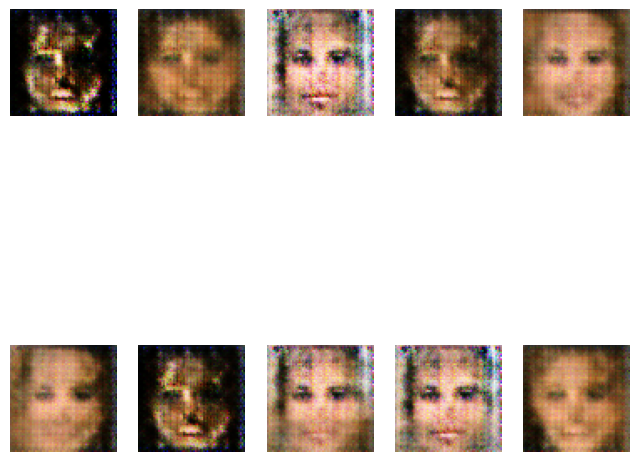

1563/1563 [==============================] - 34s 22ms/step - d_loss: 0.7541 - g_loss: 0.7415
Epoch 5/60
1561/1563 [============================>.] - ETA: 0s - d_loss: 0.7566 - g_loss: 0.7394

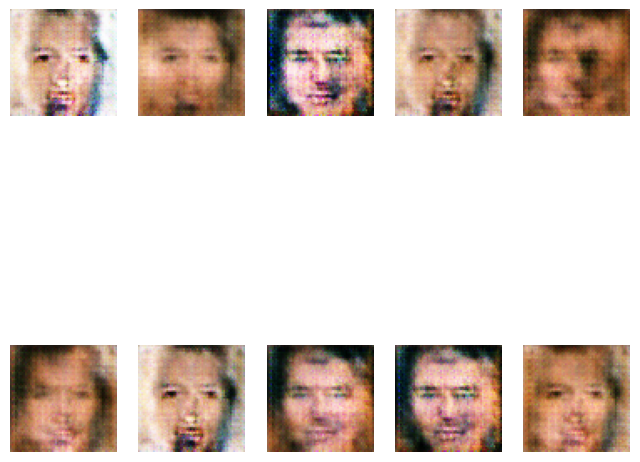

1563/1563 [==============================] - 34s 22ms/step - d_loss: 0.7566 - g_loss: 0.7393
Epoch 6/60
1562/1563 [============================>.] - ETA: 0s - d_loss: 0.7552 - g_loss: 0.7347

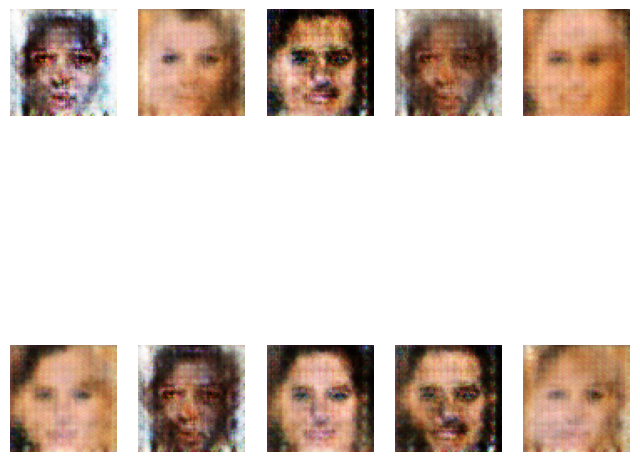

1563/1563 [==============================] - 34s 22ms/step - d_loss: 0.7552 - g_loss: 0.7347
Epoch 7/60
1562/1563 [============================>.] - ETA: 0s - d_loss: 0.7489 - g_loss: 0.7147

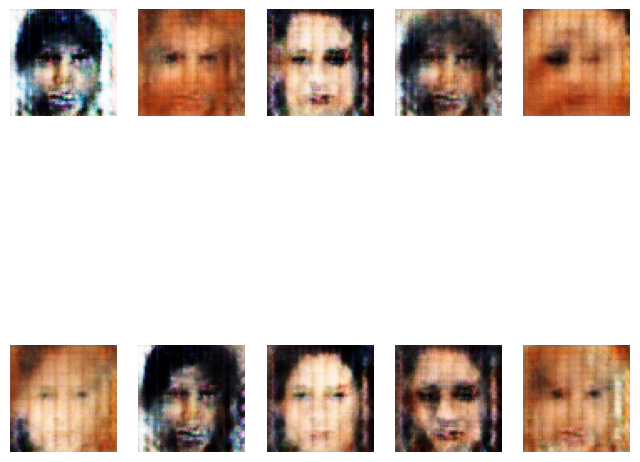

1563/1563 [==============================] - 35s 22ms/step - d_loss: 0.7488 - g_loss: 0.7147
Epoch 8/60
1562/1563 [============================>.] - ETA: 0s - d_loss: 0.7423 - g_loss: 0.7264

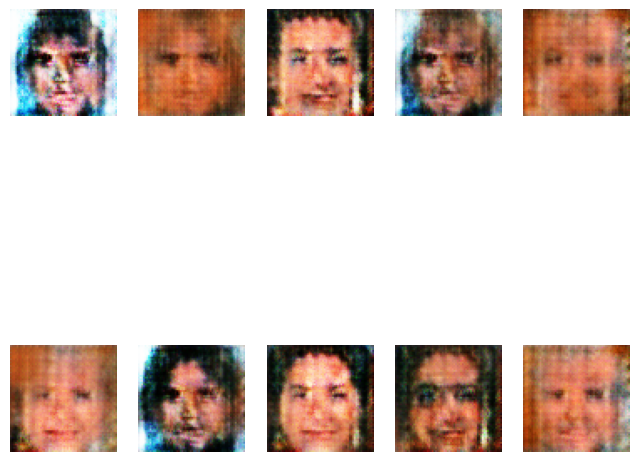

1563/1563 [==============================] - 34s 22ms/step - d_loss: 0.7423 - g_loss: 0.7264
Epoch 9/60
1561/1563 [============================>.] - ETA: 0s - d_loss: 0.7325 - g_loss: 0.7269

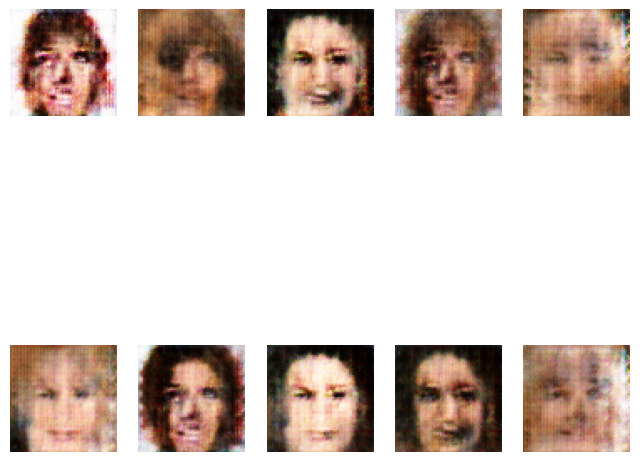

1563/1563 [==============================] - 34s 22ms/step - d_loss: 0.7326 - g_loss: 0.7270
Epoch 10/60
1563/1563 [==============================] - ETA: 0s - d_loss: 0.7275 - g_loss: 0.7260

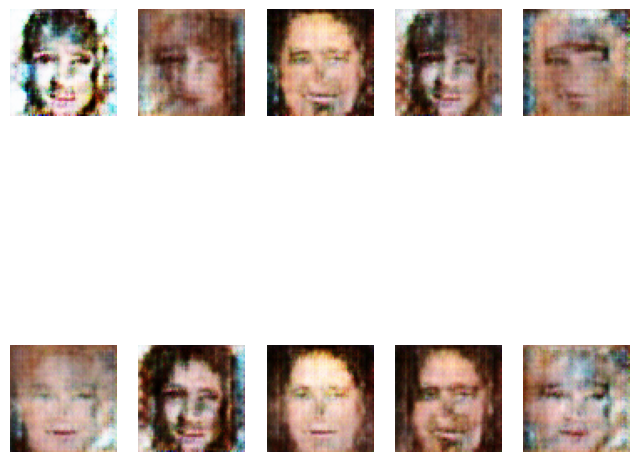

1563/1563 [==============================] - 34s 22ms/step - d_loss: 0.7275 - g_loss: 0.7260
Epoch 11/60
1563/1563 [==============================] - ETA: 0s - d_loss: 0.7270 - g_loss: 0.7196

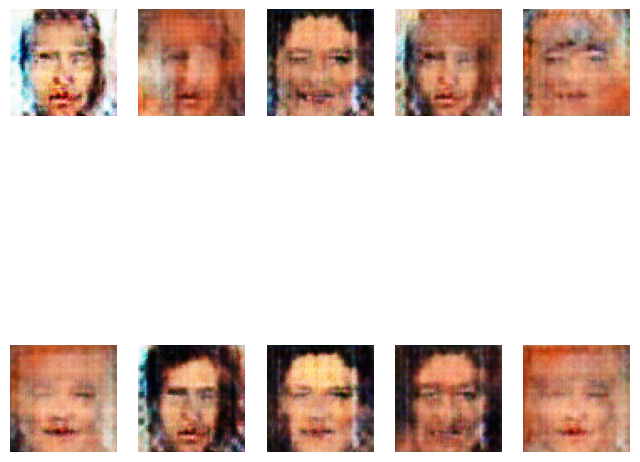

1563/1563 [==============================] - 35s 23ms/step - d_loss: 0.7270 - g_loss: 0.7196
Epoch 12/60
1563/1563 [==============================] - ETA: 0s - d_loss: 0.7252 - g_loss: 0.7243

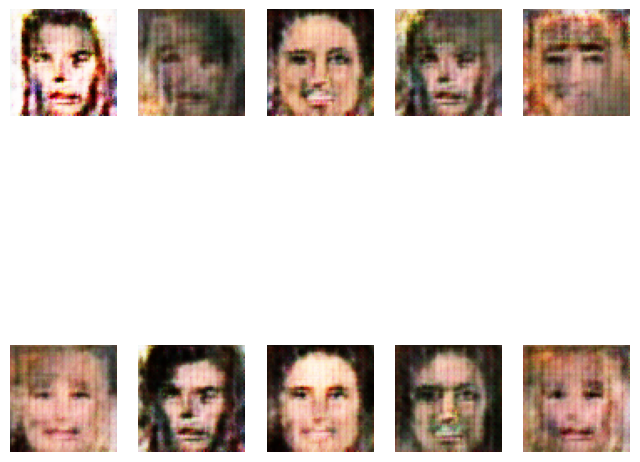

1563/1563 [==============================] - 34s 22ms/step - d_loss: 0.7252 - g_loss: 0.7243
Epoch 13/60
1561/1563 [============================>.] - ETA: 0s - d_loss: 0.7179 - g_loss: 0.7013

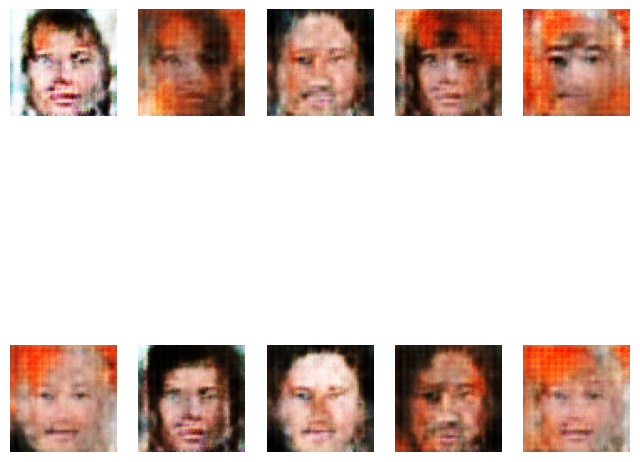

1563/1563 [==============================] - 34s 22ms/step - d_loss: 0.7179 - g_loss: 0.7014
Epoch 14/60
1561/1563 [============================>.] - ETA: 0s - d_loss: 0.7180 - g_loss: 0.7213

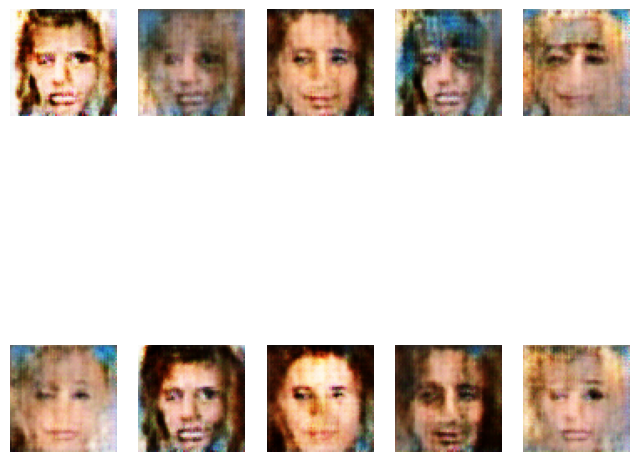

1563/1563 [==============================] - 34s 22ms/step - d_loss: 0.7180 - g_loss: 0.7210
Epoch 15/60
1561/1563 [============================>.] - ETA: 0s - d_loss: 0.7148 - g_loss: 0.6760

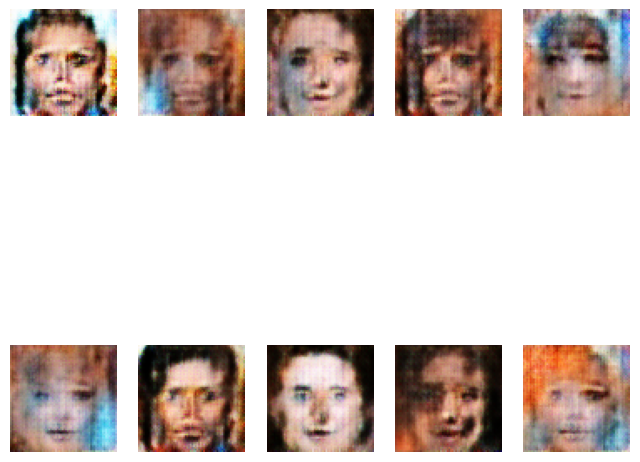

1563/1563 [==============================] - 34s 22ms/step - d_loss: 0.7148 - g_loss: 0.6761
Epoch 16/60
1563/1563 [==============================] - ETA: 0s - d_loss: 0.7253 - g_loss: 0.7079

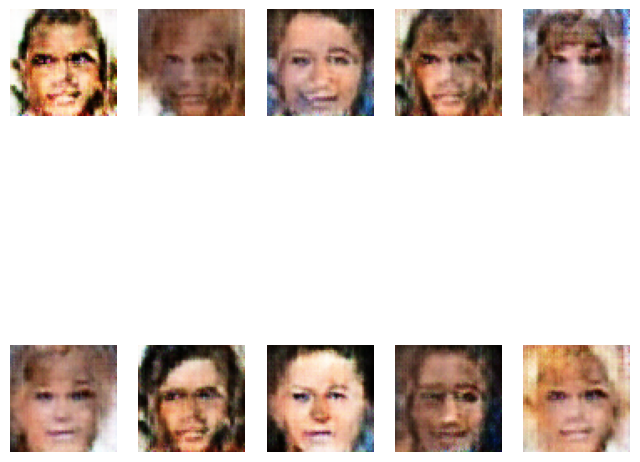

1563/1563 [==============================] - 34s 22ms/step - d_loss: 0.7253 - g_loss: 0.7079
Epoch 17/60
1561/1563 [============================>.] - ETA: 0s - d_loss: 0.7256 - g_loss: 0.7041

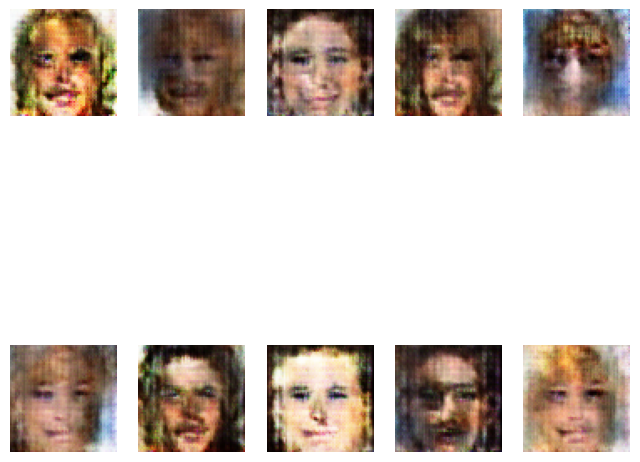

1563/1563 [==============================] - 35s 22ms/step - d_loss: 0.7256 - g_loss: 0.7041
Epoch 18/60
1561/1563 [============================>.] - ETA: 0s - d_loss: 0.7239 - g_loss: 0.7029

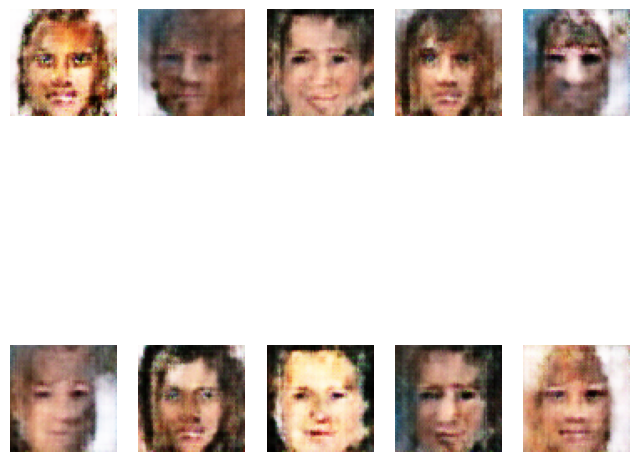

1563/1563 [==============================] - 34s 22ms/step - d_loss: 0.7239 - g_loss: 0.7029
Epoch 19/60
1561/1563 [============================>.] - ETA: 0s - d_loss: 0.7212 - g_loss: 0.7039

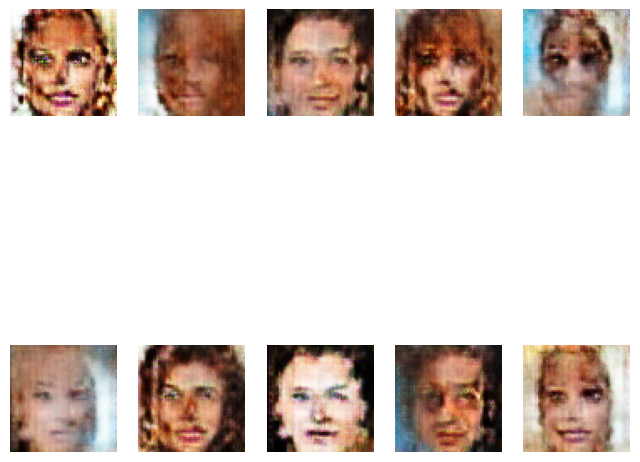

1563/1563 [==============================] - 34s 22ms/step - d_loss: 0.7213 - g_loss: 0.7039
Epoch 20/60
1563/1563 [==============================] - ETA: 0s - d_loss: 0.7239 - g_loss: 0.7000

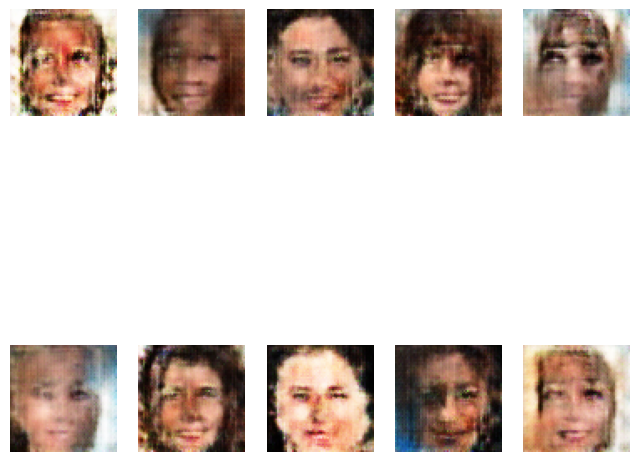

1563/1563 [==============================] - 34s 22ms/step - d_loss: 0.7239 - g_loss: 0.7000
Epoch 21/60
1562/1563 [============================>.] - ETA: 0s - d_loss: 0.7201 - g_loss: 0.7015

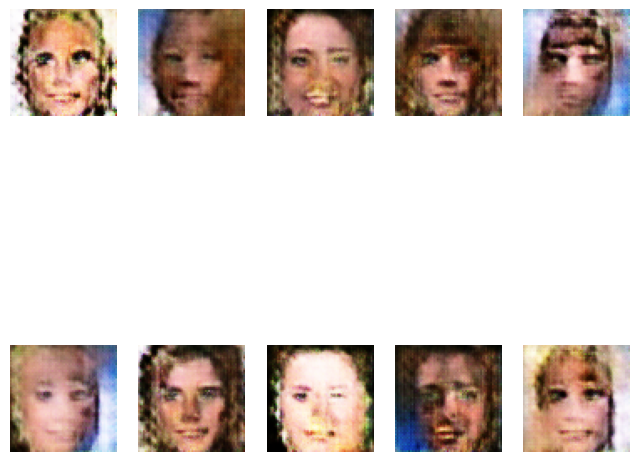

1563/1563 [==============================] - 35s 22ms/step - d_loss: 0.7201 - g_loss: 0.7015
Epoch 22/60
1561/1563 [============================>.] - ETA: 0s - d_loss: 0.7178 - g_loss: 0.7007

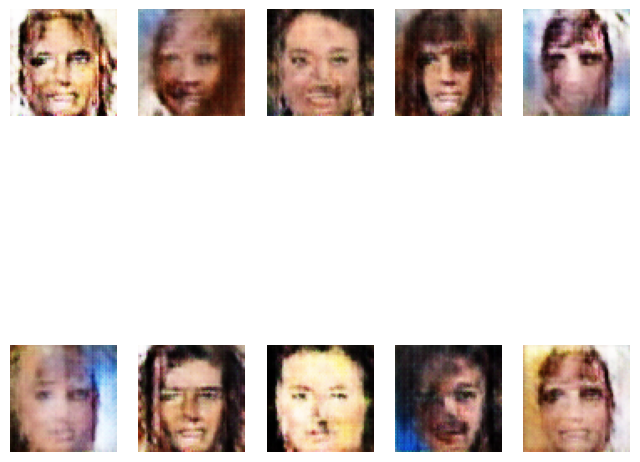

1563/1563 [==============================] - 35s 22ms/step - d_loss: 0.7178 - g_loss: 0.7007
Epoch 23/60
1563/1563 [==============================] - ETA: 0s - d_loss: 0.7166 - g_loss: 0.6945

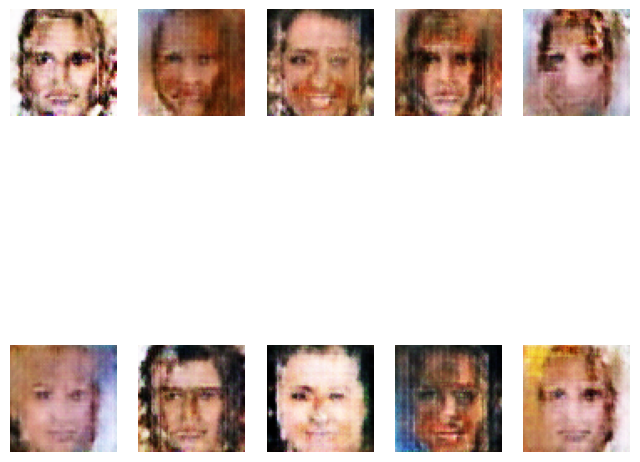

1563/1563 [==============================] - 34s 22ms/step - d_loss: 0.7166 - g_loss: 0.6945
Epoch 24/60
1561/1563 [============================>.] - ETA: 0s - d_loss: 0.7184 - g_loss: 0.6947

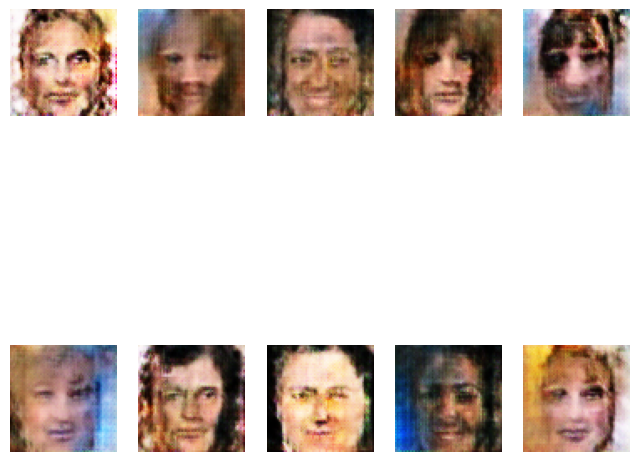

1563/1563 [==============================] - 35s 22ms/step - d_loss: 0.7184 - g_loss: 0.6947
Epoch 25/60
1561/1563 [============================>.] - ETA: 0s - d_loss: 0.7150 - g_loss: 0.6991

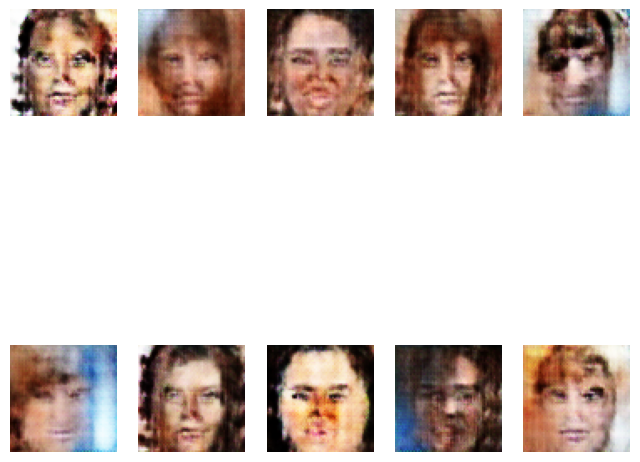

1563/1563 [==============================] - 34s 22ms/step - d_loss: 0.7150 - g_loss: 0.6991
Epoch 26/60
1563/1563 [==============================] - ETA: 0s - d_loss: 0.7179 - g_loss: 0.6952

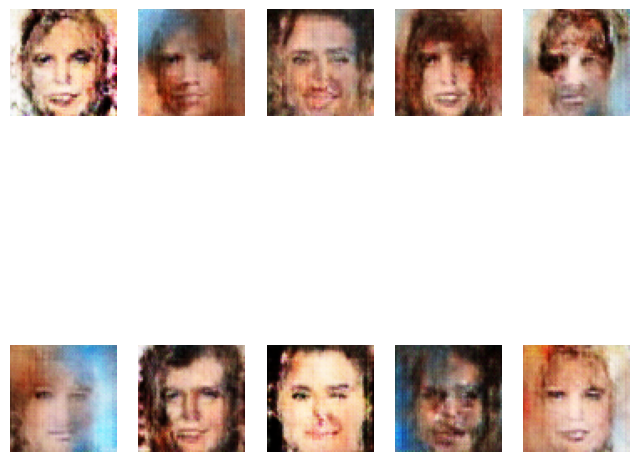

1563/1563 [==============================] - 35s 22ms/step - d_loss: 0.7179 - g_loss: 0.6952
Epoch 27/60
1562/1563 [============================>.] - ETA: 0s - d_loss: 0.7144 - g_loss: 0.6922

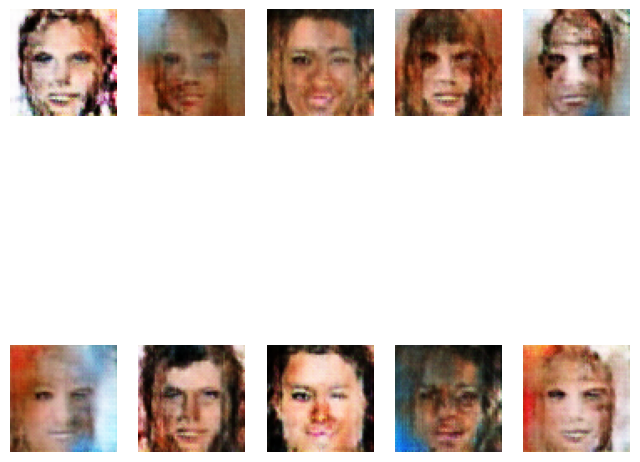

1563/1563 [==============================] - 35s 23ms/step - d_loss: 0.7144 - g_loss: 0.6922
Epoch 28/60
1563/1563 [==============================] - ETA: 0s - d_loss: 0.7145 - g_loss: 0.6881

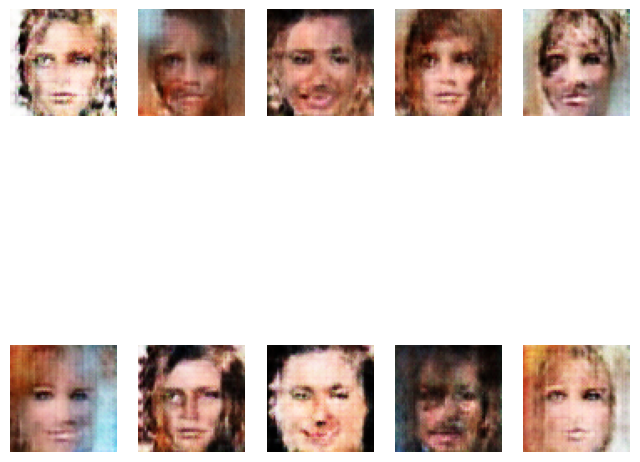

1563/1563 [==============================] - 35s 22ms/step - d_loss: 0.7145 - g_loss: 0.6881
Epoch 29/60
1563/1563 [==============================] - ETA: 0s - d_loss: 0.7123 - g_loss: 0.6956

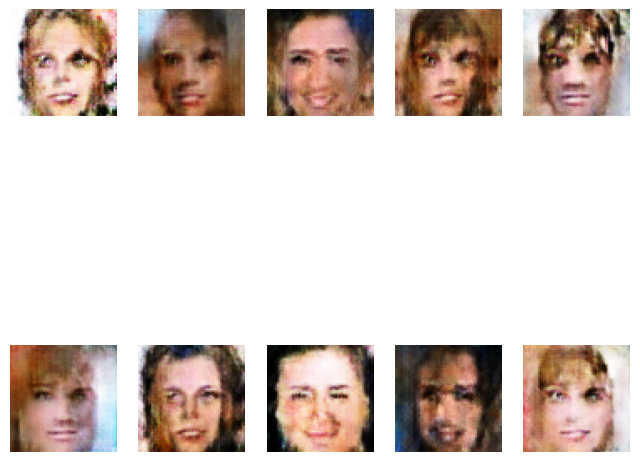

1563/1563 [==============================] - 35s 22ms/step - d_loss: 0.7123 - g_loss: 0.6956
Epoch 30/60
1305/1563 [========================>.....] - ETA: 5s - d_loss: 0.7131 - g_loss: 0.6911

KeyboardInterrupt: 

In [119]:
N_EPOCHS = 60
dcgan.fit(train_image, epochs=N_EPOCHS, callbacks=[DCGANMonitor()])